In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
%matplotlib inline
torch.manual_seed(0) # Set for testing purposes, please do not change!

In [2]:
# Display Images
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

In [3]:
# Get Generator Block
def get_generator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True)
    )

In [4]:
# Testing -> Get Generator Block
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU

    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


In [5]:

# Generator

class Generator(nn.Module):
  def __init__(self,noise_input=10,input_dim= 784,hidden_dim=128):
    super(Generator,self).__init__()

    self.gen = nn.Sequential(
        get_generator_block(noise_input, hidden_dim),  # pass noise through hidden layer
        get_generator_block(hidden_dim,hidden_dim * 2), # doubling
        get_generator_block(hidden_dim*2,hidden_dim*4), # doubling
        get_generator_block(hidden_dim*4,hidden_dim*8), # doubling
        nn.Linear(hidden_dim*8,input_dim), # To make fit to 728 as image input, we make it downgrade or make it linear
        nn.Sigmoid()
    )
     # Function takes in noise and returns image, it basically cal;'s the above process
  def forward(self, noise):
       return self.gen(noise)

  def get_gen(self):
        return self.gen

In [6]:
# Testing -> Generator
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()

    # Check there are six modules in the sequential part
    assert len(gen) == 6
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.min() < 0.5, "Don't use a block in your solution"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


In [7]:
# Noise
def get_noise(n_samples, z_dim, device='cpu'):
    return torch.randn(n_samples, z_dim, device=device)

In [8]:
# Discriminator
def get_discriminator_block(input_dim, output_dim):
    return nn.Sequential(
        nn.Linear(input_dim, output_dim),
        nn.LeakyReLU(negative_slope=0.2, inplace=True)
    )

In [9]:
# Testing -> Discriminator
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)

    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5

test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


In [10]:
# Discriminator Class
class Discriminator(nn.Module):
    def __init__(self, input_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()

        self.dis = nn.Sequential(
            get_discriminator_block(input_dim, hidden_dim * 4), #  input_dim = default = 784 and hidden = 128 = 128 * 4 = 512, which means now 784-512
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2), #  input_dim = default = 512 and hidden  = 128 * 2 = 256, which means now 512-256
            get_discriminator_block(hidden_dim * 2, hidden_dim), #  input_dim = default = 256 and hidden  = 128 * 2 = 256, which means now 256-128
            nn.Linear(hidden_dim, 1) #  input_dim = default = 128 and hidden  1, which means now 256-1, which means 1 is real and 0 is fake
        )

    def forward(self, image):
        return self.dis(image)

    def get_dis(self):
        return self.dis

In [11]:
# Testing -> Discriminator Class
def test_discriminator(z_dim, hidden_dim, num_test=100):

    disc = Discriminator(z_dim, hidden_dim).get_dis()

    # Check there are three parts
    assert len(disc) == 4

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

    # Don't use a block
    assert not isinstance(disc[-1], nn.Sequential)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


In [12]:
# Training Parameter

# criterion: the loss function
criterion = nn.BCEWithLogitsLoss()
# n_epochs: the number of times you iterate through the entire dataset when training
n_epochs = 200
# z_dim: the dimension of the noise vector
z_dim = 64
# display_step: how often to display/visualize the images
display_step = 500
# batch_size: the number of images per forward/backward pass
batch_size = 128
# lr: the learning rate
lr = 0.00001
# device: the device type, here using a GPU (which runs CUDA), not CPU
device = 'cpu'


dataloader = DataLoader(
    MNIST('.', download=True, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

In [13]:
# Init all Methods from above
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device)
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

In [14]:
# Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss.
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
  # This will take generator, descriminator, loss function, number o ral imgaes to be generated , number of images, noise vector and device

  # Create noise vectors and generate fake images
  noise = get_noise(num_images, z_dim, device=device)
  fake_images = gen(noise).detach()

  # Discriminator on Fake Images
  fake_preds = disc(fake_images)
  fake_labels = torch.zeros_like(fake_preds) #  Ground truth for real images is 0
  fake_loss = criterion(fake_preds, fake_labels)

  # Discriminator on Real Images
  real_preds = disc(real)
  real_labels = torch.ones_like(real_preds)  # Ground truth for real images is 1
  real_loss = criterion(real_preds, real_labels)

  # combine both losses
  disc_loss = (real_loss + fake_loss) / 2

  return disc_loss


def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
  # This will take generator, descriminator, loss function, number o ral imgaes to be generated , number of images, noise vector and device

  # Create noise vectors and generate fake images
  noise = get_noise(num_images, z_dim, device=device)
  fake_images = gen(noise)

  # Get discriminator’s predictions on the fake images
  fake_preds = disc(fake_images)

  # Calculate the generator’s loss
  real_labels = torch.ones_like(fake_preds)  # Generator wants discriminator to think fake is real
  gen_loss = criterion(fake_preds, real_labels)

  return gen_loss

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 1.6386649051904678, discriminator loss: 0.37022770601510996


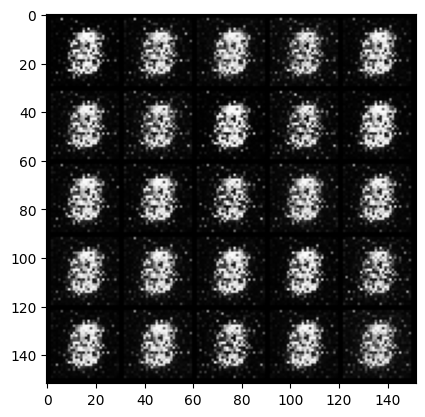

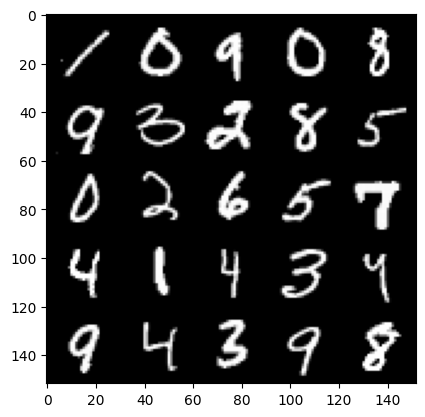

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: 2.8767830080986023, discriminator loss: 0.12300914088636629


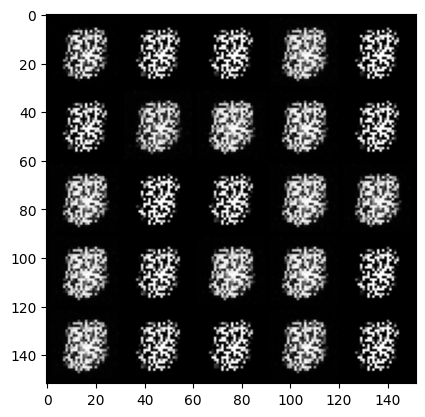

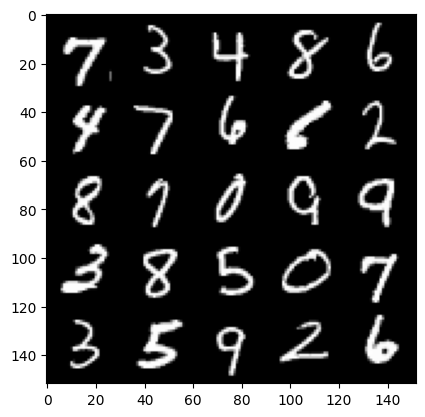

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: 5.395350874900822, discriminator loss: 0.02992378104664387


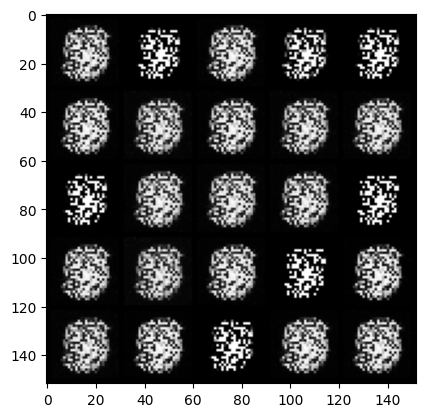

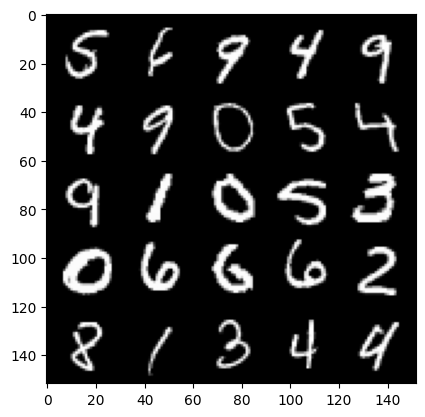

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: 7.207018782615671, discriminator loss: 0.012744129607453924


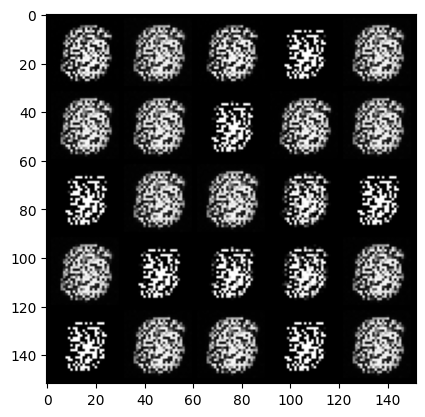

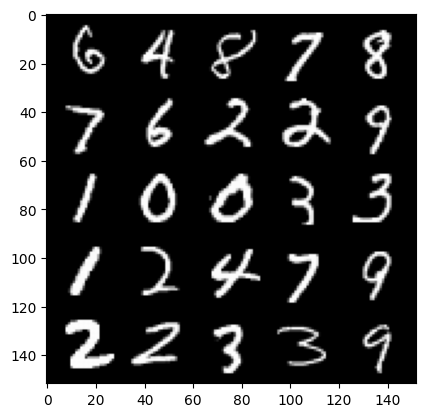

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: 8.150490470886236, discriminator loss: 0.005770695050712679


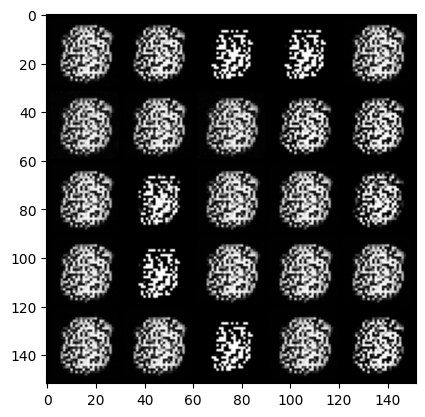

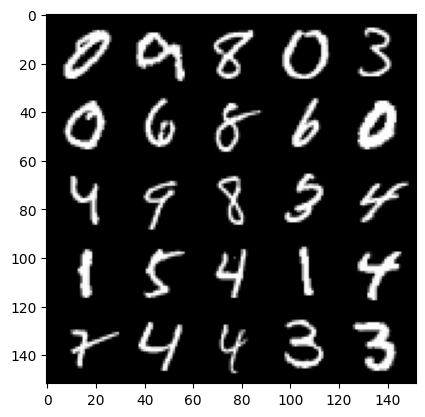

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: 8.611038934707642, discriminator loss: 0.0032960958594921964


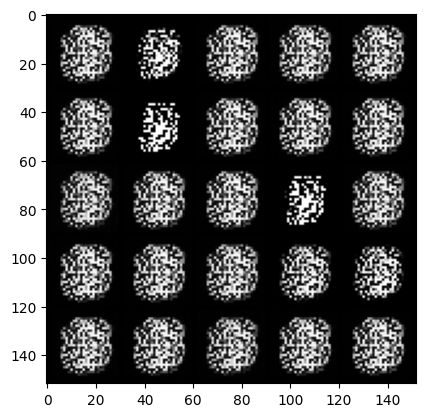

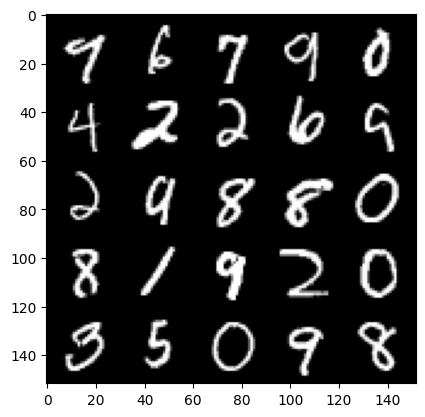

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: 8.84325693321227, discriminator loss: 0.0019018399103078992


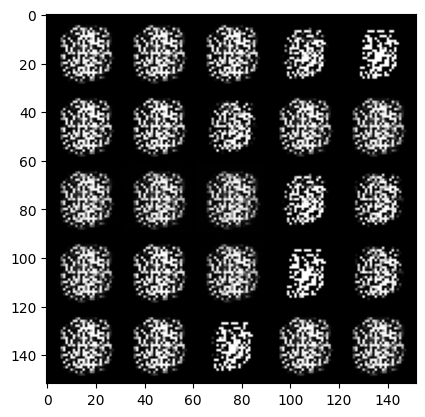

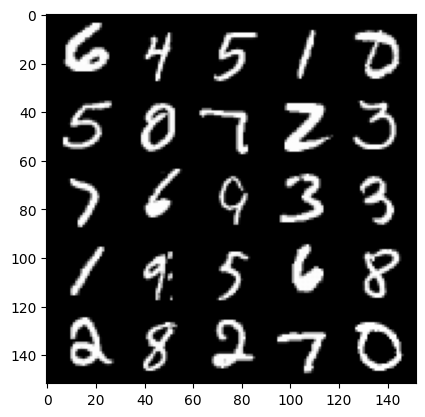

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: 8.905799400329585, discriminator loss: 0.0013297248369199227


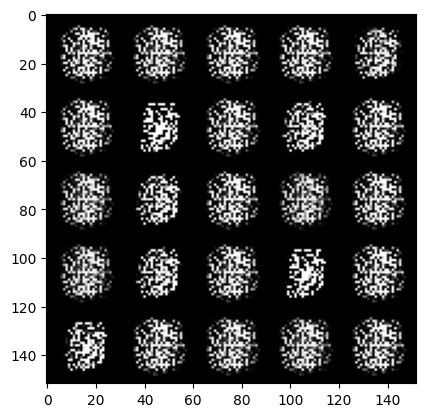

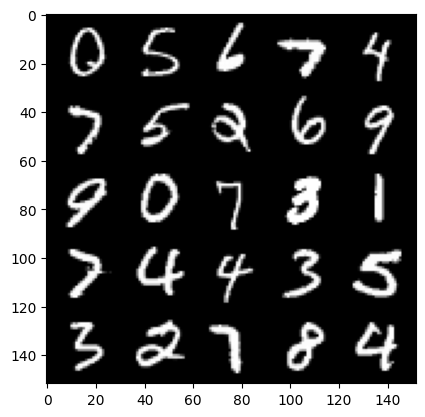

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: 9.158664888381946, discriminator loss: 0.0008433371482533398


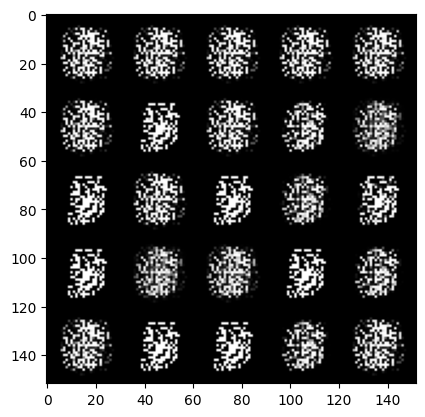

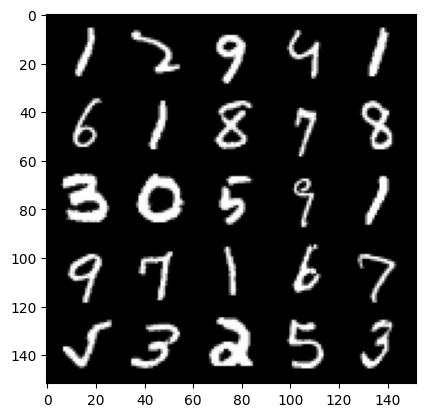

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: 9.361857038497932, discriminator loss: 0.0005121466941200196


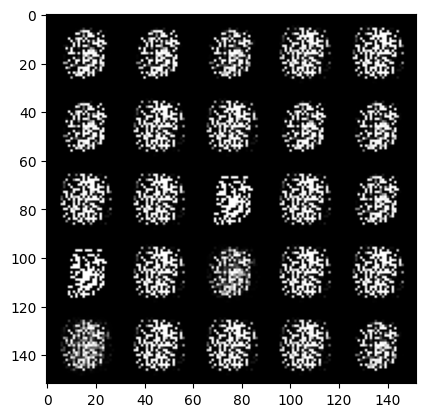

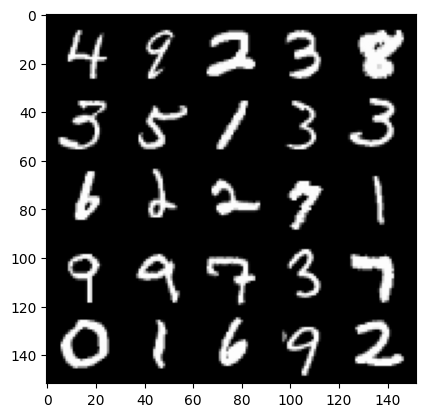

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: 9.93849557495117, discriminator loss: 0.0004110966893495062


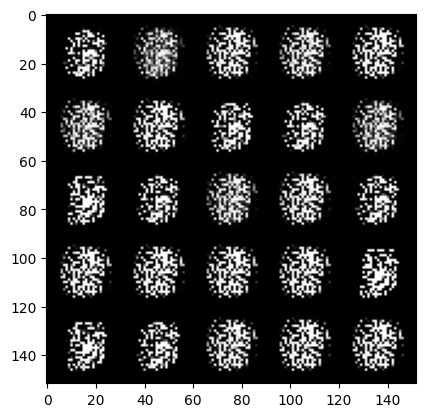

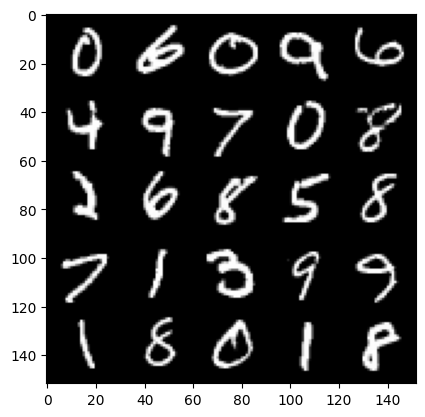

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: 11.032951429367065, discriminator loss: 0.0003431841226120012


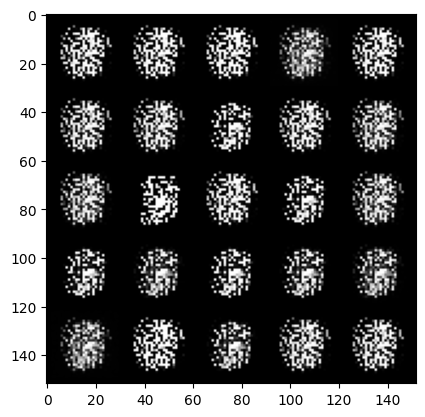

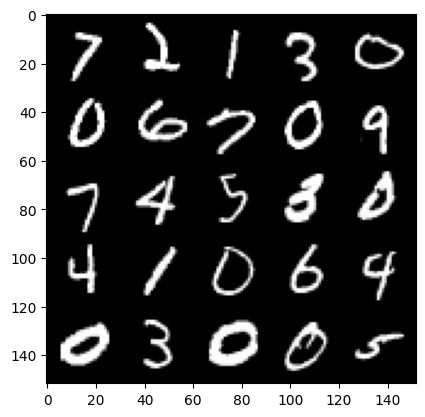

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: 11.973171882629398, discriminator loss: 0.00030698637233581423


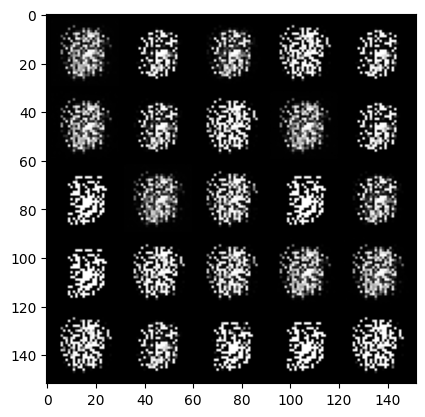

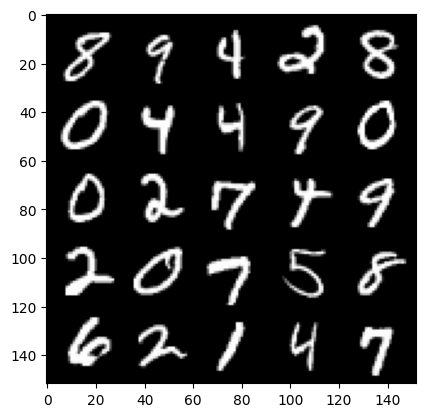

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: 13.054302497863782, discriminator loss: 0.0002635171407600863


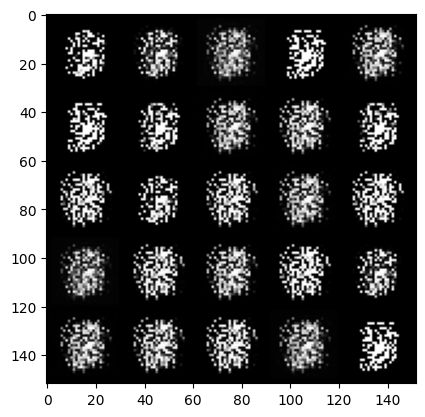

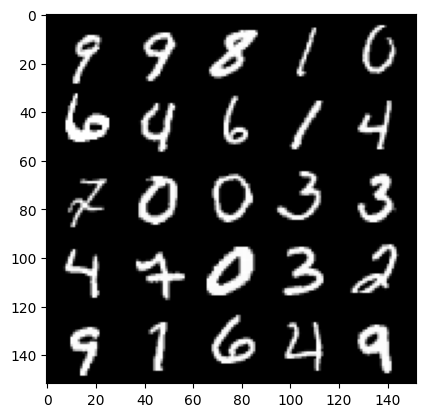

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: 13.967661796569843, discriminator loss: 0.00021627238744986255


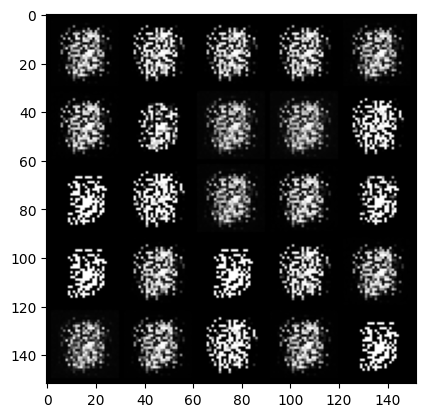

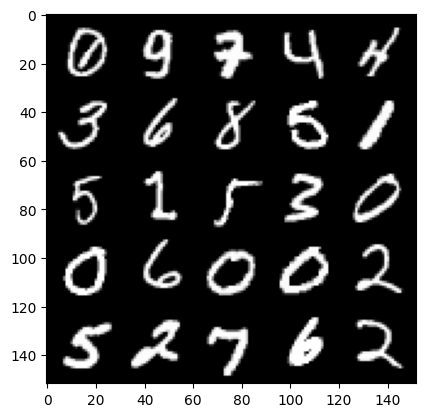

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: 14.54307766723632, discriminator loss: 0.00017953557617147466


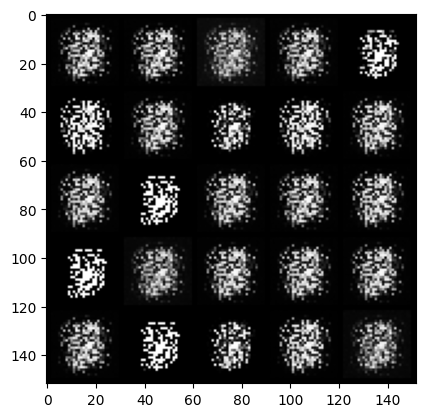

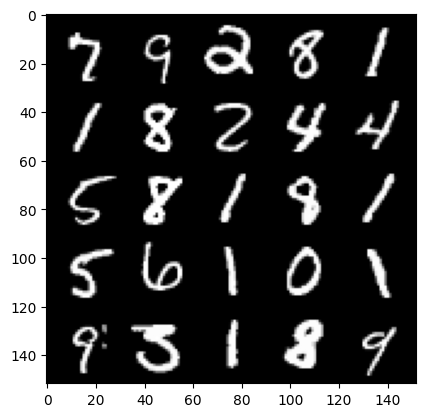

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: 14.955383522033701, discriminator loss: 0.0001554868443927262


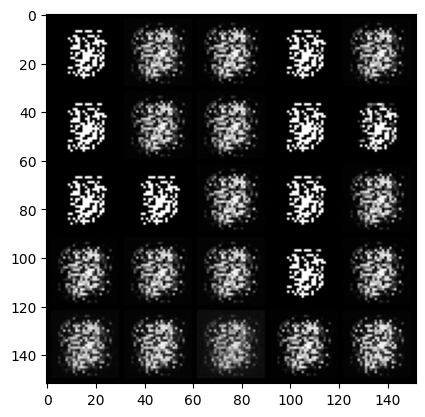

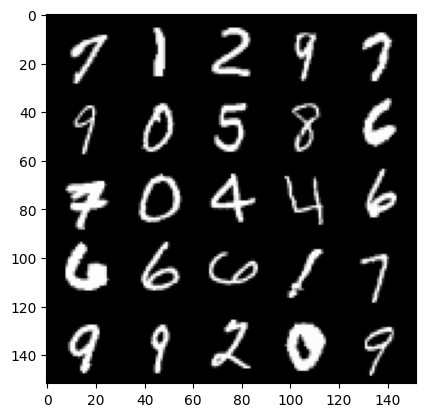

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: 15.452878665924072, discriminator loss: 0.00011721836857759633


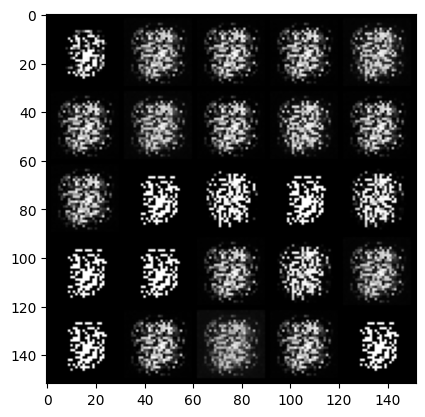

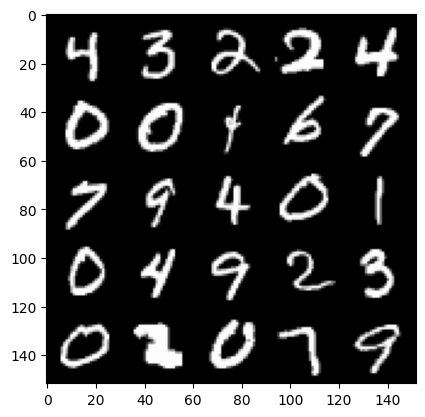

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: 15.554349716186529, discriminator loss: 7.863463849935211e-05


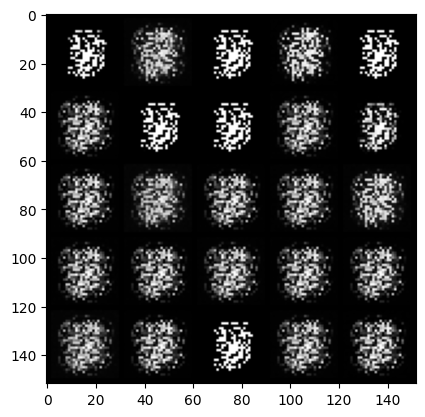

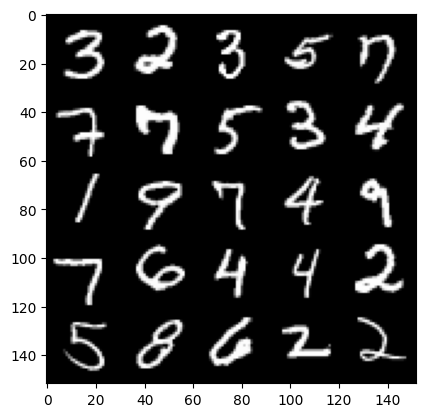

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: 15.222290479660042, discriminator loss: 5.45208734474727e-05


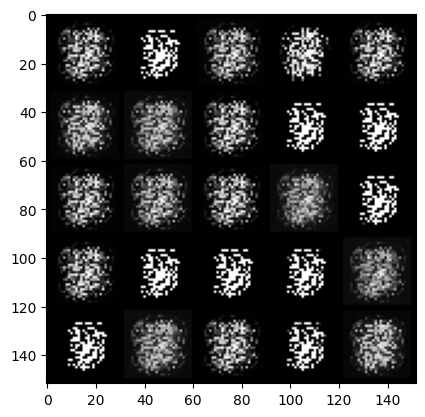

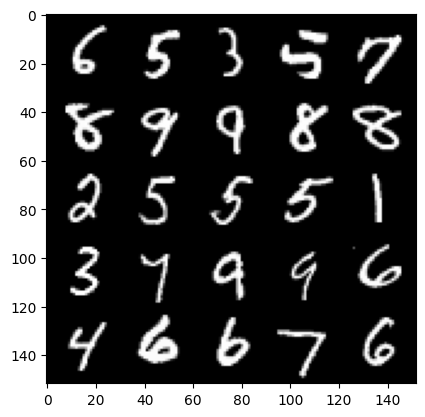

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: 14.728984066009527, discriminator loss: 3.742648237857792e-05


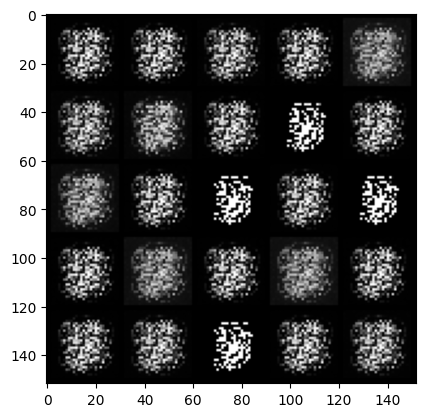

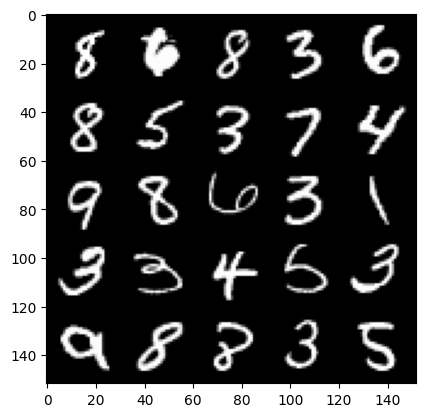

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: 14.248561574935916, discriminator loss: 2.642343236766465e-05


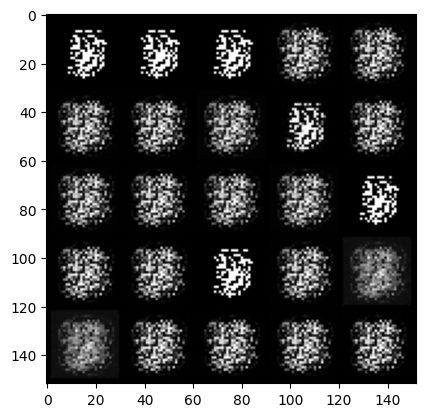

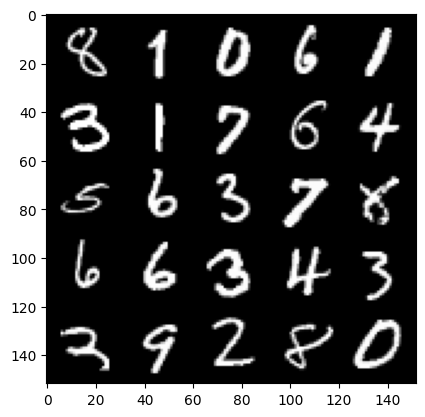

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: 14.029331930160525, discriminator loss: 1.7768255172086352e-05


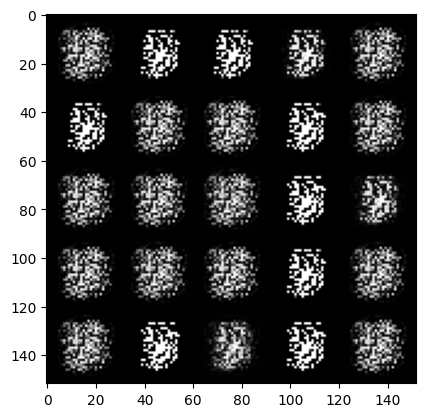

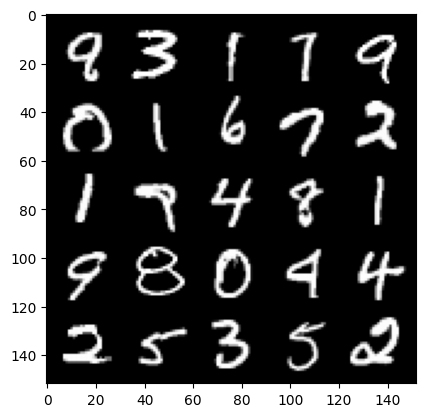

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: 13.752067211151115, discriminator loss: 1.2400416555010442e-05


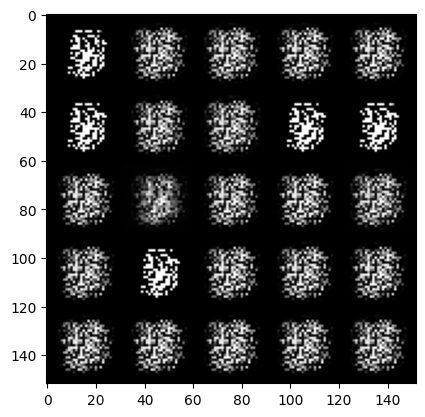

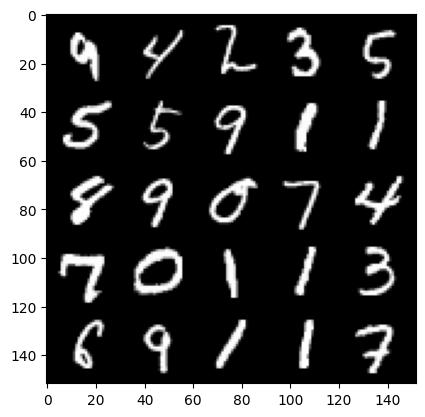

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: 13.417143877029421, discriminator loss: 9.602305931139192e-06


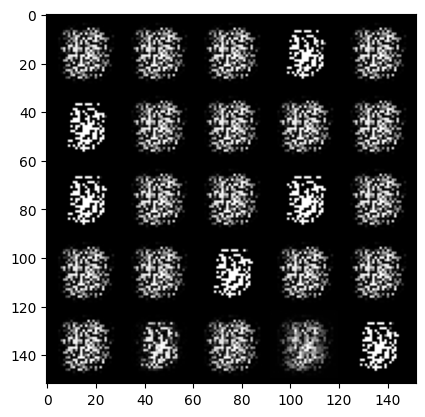

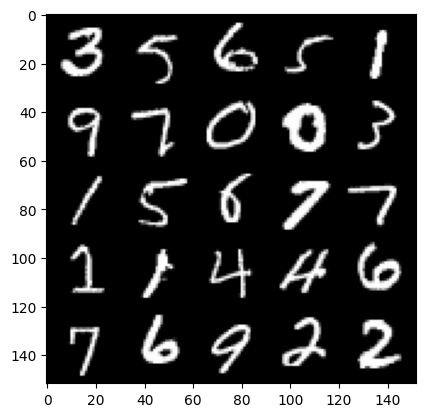

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: 13.189387725830086, discriminator loss: 7.472251815897832e-06


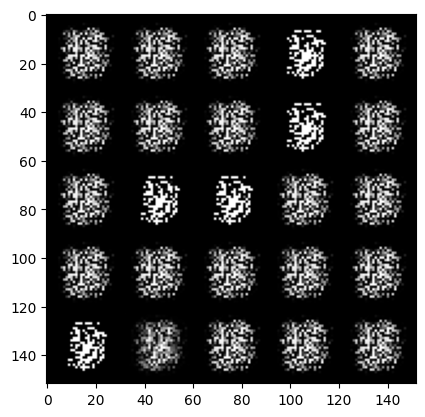

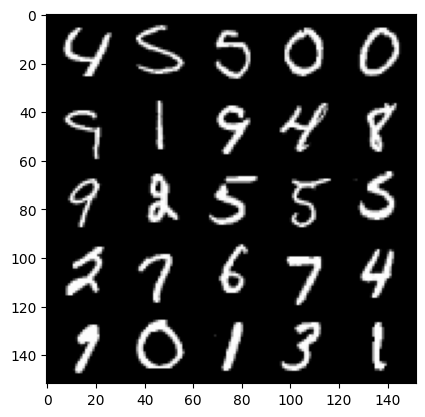

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: 13.853342321395877, discriminator loss: 7.322276837385293e-06


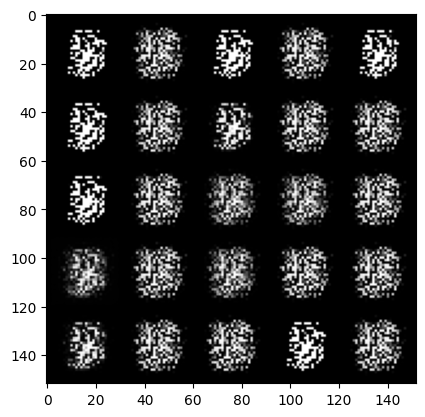

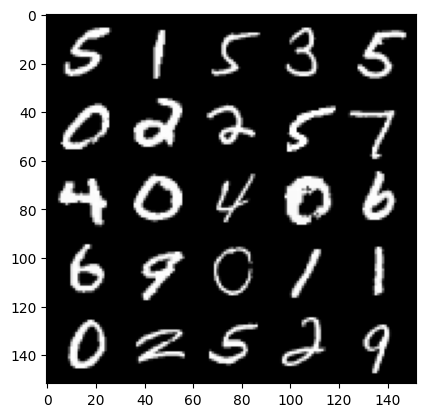

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: 14.73240480422973, discriminator loss: 5.908162004857335e-06


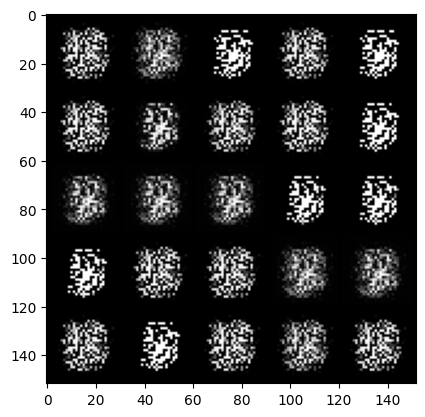

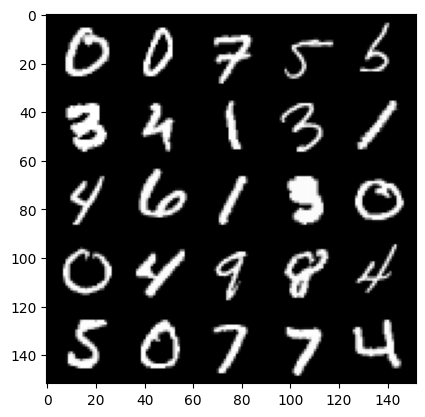

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: 15.530689231872568, discriminator loss: 4.2491983662102904e-06


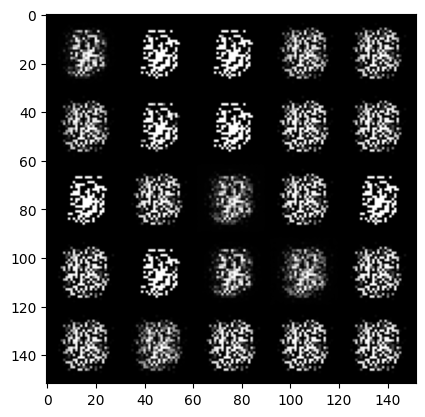

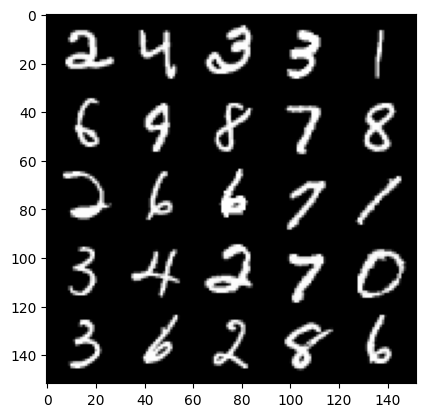

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: 16.21591143608095, discriminator loss: 2.8732363467156562e-06


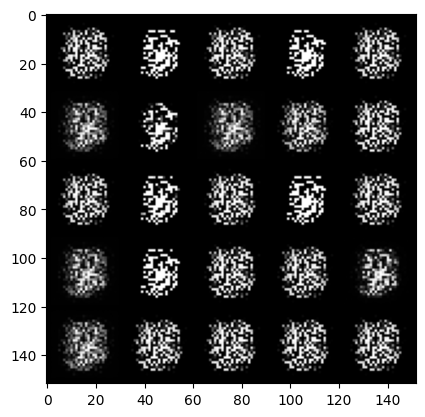

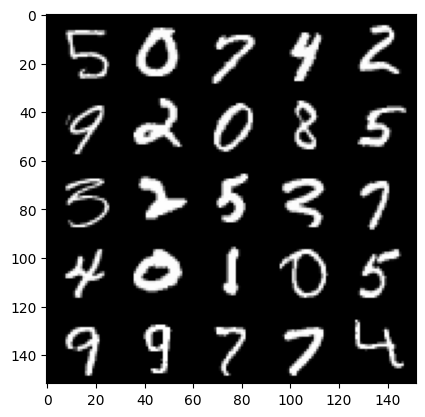

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 16.84844974517823, discriminator loss: 2.0589556058325786e-06


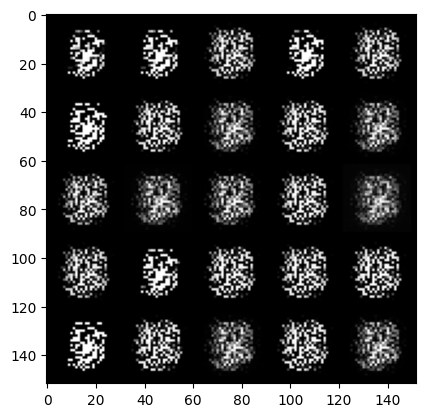

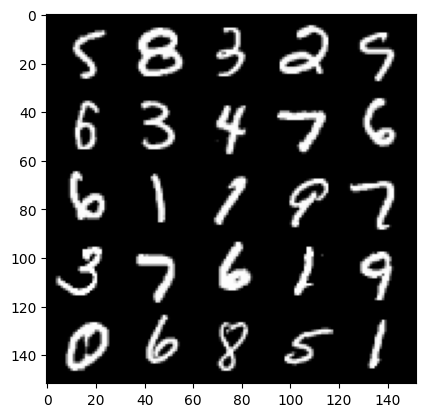

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 17.08094689178466, discriminator loss: 1.6083646740128202e-06


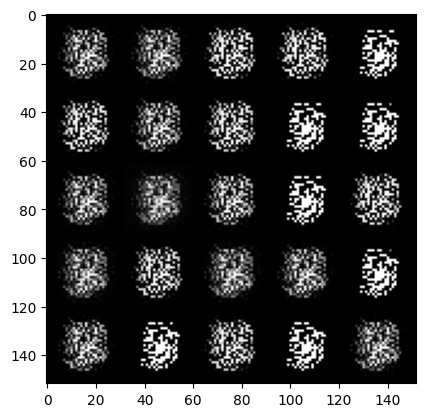

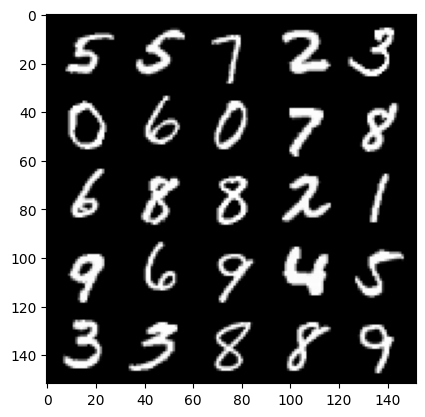

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 16.940283954620334, discriminator loss: 6.080975454239024e-06


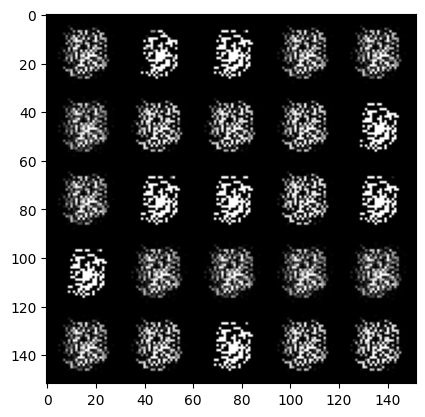

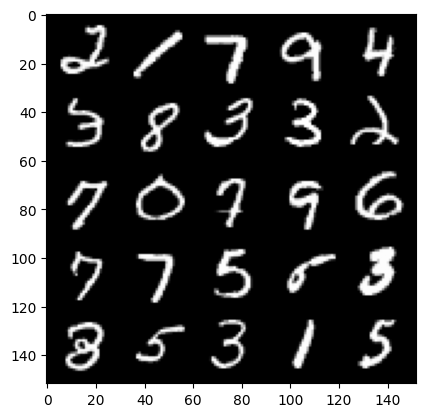

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 16.67650099372864, discriminator loss: 9.762158131422889e-06


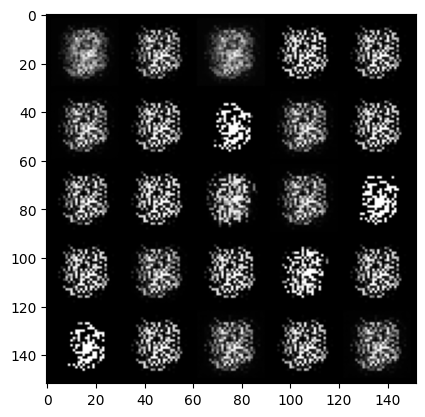

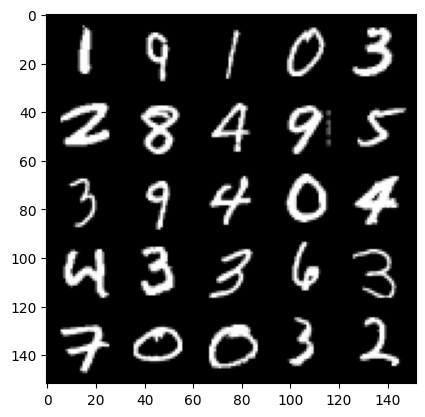

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 16.719039003372213, discriminator loss: 1.4413735859875484e-05


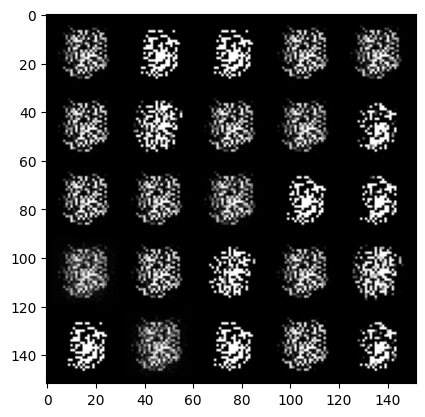

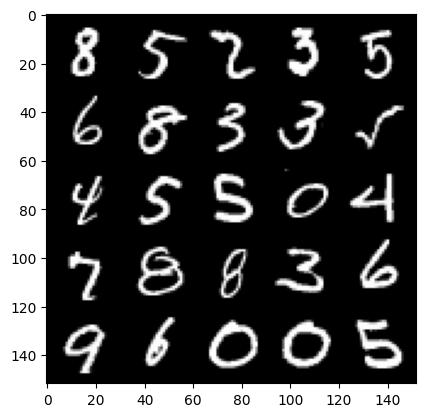

In [ ]:
# OPTIONAL PART

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):

    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)

        # Backprop through the generator
        gen_loss.backward()

        # Update optimizer for the generator
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
